<a href="https://colab.research.google.com/github/varun-ml/diffusion-models-tutorial/blob/master/toy-density-estimation/colab_guidance_free_classifiers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Classifier free guidance 


1. Class conditioned diffusion models, classifier-free guidance
    * using the score function interpretation to do classifier free guidance
    * few-shot learning example 
2. Timestep embedding and fusing it with the inputs -- as opposed to passing a scalar timestep
3. Multiple strides during generation to improve sample generation time

### Here is what we do in this script
1. Train the model to estimate condition and un-conditional score 

![Screenshot 2022-11-19 130824.png](attachment:f881a2f2-b664-4e5e-90e9-731652ff91bb.png)

* We train a model that accepts 5d -- where 3rd dimension is the moon and 4th dimension is circles, and outputs 2d data (5th dim is timestep)
* when 3rd dimension is on (1) the model should output the moon distribution, and output circle distribution if the 4th dimension is on
* we use 0-0 for 3rd and 4th dimension to esimate unconditional distribution, 1-1 is invalid combination


In [1]:
generate_new_data = True
train_new_model = True
dont_write = True
epochs = 100 # make epoch=300 for better outputs

In [2]:
# utils 
import pickle

def load_cached(filename):
    with open(filename, 'rb') as ff:
        return pickle.load(ff)
    
def write_cached(data, filename):
    with open(filename, 'wb') as ff:
        pickle.dump(data, ff, protocol=pickle.HIGHEST_PROTOCOL)

In [3]:
import os
import os.path as osp

data_paths = osp.join(os.getcwd(), 'saved', 'saved_data')
model_paths = osp.join(os.getcwd(), 'saved','saved_models')

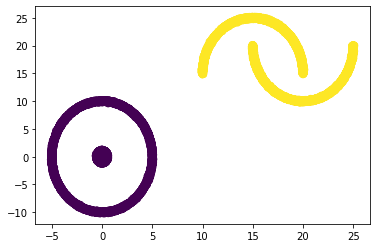

In [4]:
from sklearn import datasets
from matplotlib import pyplot as plt

if generate_new_data:
    circles, _ = datasets.make_circles(1024*128, noise=0.01, factor=0.1, shuffle=True)
    circles = circles* [5., 10.] 
    circles = circles.T
else:
    circles = load_cached(os.path.join(data_paths, '2.circle.pkl'))

if generate_new_data:
    make_moons, labels = datasets.make_moons(n_samples=1024*128, noise=0.01)
    make_moons = make_moons* [5., 10.] 
    make_moons = make_moons.T
else:
    make_moons = load_cached(os.path.join(data_paths, '2.moons.pkl'))

# make moons class 0 and circles class 1
import numpy

moons_3rd_dim = numpy.zeros(len(make_moons[0]))
# half of the values are used to train unconditional model
moons_4th_dim = numpy.hstack([numpy.ones(int(len(make_moons[0])/2)), numpy.zeros(int(len(make_moons[0])/2))])

circles_4th_dim = numpy.zeros(len(circles[0]))
# half of the values are used to train unconditional model
circles_3rd_dim = numpy.hstack([numpy.ones(int(len(circles[0])/2)), numpy.zeros(int(len(circles[0])/2))])

make_moons = numpy.vstack([make_moons+15, moons_3rd_dim, moons_4th_dim])
circles = numpy.vstack([circles, circles_3rd_dim, circles_4th_dim])

if generate_new_data:
    complex_data = numpy.hstack([make_moons, circles ]) 
    numpy.random.shuffle(complex_data.T)
    if not dont_write:
      write_cached(complex_data, os.path.join(data_paths, '2.complex_classified.pkl'))
else:
    complex_data = load_cached(os.path.join(data_paths, '2.complex_classified.pkl'))

# plotting class-labeled da1a, 
data__ = numpy.vstack([complex_data[0], complex_data[1], complex_data[2] + complex_data[3]*2])
data__ = data__.T[data__[2]>0, :]
data__ = data__.T
plt.scatter(data__[0], data__[1], c=data__[2])

(-1.0, 1.0)

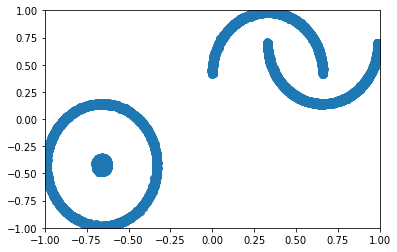

In [5]:
import torch

complex_data = torch.Tensor(complex_data)
# transform to range
def transform(data):
    min_, max_ = torch.min(data, axis=1), torch.max(data, axis=1)
    data_transformed = 2 * (data.sub(min_.values[:, None])).div((max_.values - min_.values)[:, None]) - 1
    return data_transformed, min_, max_

data_transformed, min_, max_ = transform(complex_data[:2, :])
data_transformed = torch.vstack([data_transformed, complex_data[2], complex_data[3]])
plt.scatter(data_transformed[0], data_transformed[1])
plt.xlim([-1, 1])
plt.ylim([-1, 1])

(-15.0, 30.0)

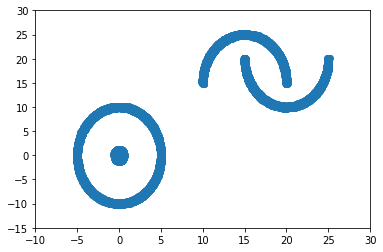

In [6]:
def reverse_transform(data_transformed, min_, max_):
    # data_transformed = 2 * (data.sub(min_.values[:, None])).div((max_.values - min_.values)[:, None]) - 1
    data = (data_transformed + 1).mul((max_.values - min_.values)[:, None]).add(min_.values[:, None]*2)/2
    return data
    
complex_data = reverse_transform(data_transformed[:2, :], min_, max_)
complex_data = numpy.vstack([complex_data, data_transformed[2], data_transformed[3]])

plt.scatter(complex_data[0], complex_data[1])
plt.xlim([-10, 30])
plt.ylim([-15, 30])

In [7]:
# train model

# ####### i am not getting desired results with the cosine beta schedule from the hugging face repo
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.0001, 0.02)

def linear_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

def sigmoid_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    betas = torch.linspace(-6, 6, timesteps)
    return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start

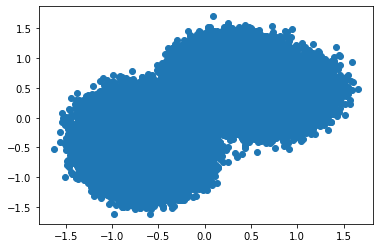

In [8]:
# Train model
timesteps = 200
# betas = linear_beta_schedule(timesteps)
betas = cosine_beta_schedule(timesteps)
alphas = 1 - betas
alphas_ = torch.cumprod(alphas, axis=0)
variance = 1 - alphas_
sd = torch.sqrt(variance)

import torch.nn.functional as F

alphas_prev_ = F.pad(alphas_[:-1], [1, 0], "constant", 1.0)
sigma_squared_q_t = (1 - alphas) * (1 - alphas_) / (1 - alphas_prev_)
log_sigma_squared_q_t = torch.log(1-alphas) + torch.log(1-alphas_) - torch.log(1-alphas_prev_)
sigma_squared_q_t_corrected = torch.exp(log_sigma_squared_q_t)

# how to add noise to the data
def get_noisy(batch, timestep):
    # we will use the reparameterization trick
    noise_at_t = torch.normal(0, std=1, size=batch.size())
    added_noise_at_t = batch.mul(torch.sqrt(alphas_[timestep])) + noise_at_t.mul(sd[timestep])
    return added_noise_at_t, noise_at_t

def recover_original(batch, timestep, noise):
    true_data = (batch.sub(noise.mul(sd[timestep]))).div(alphas_[timestep])
    return true_data
    
added_noise_at_t, noise = get_noisy(data_transformed[:2, :], 20)
plt.scatter(added_noise_at_t[0], added_noise_at_t[1])

posterior_variance = (betas) * (1 - alphas_prev_) / (1 - alphas_)

## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L196
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L78
log_posterior_variance = torch.log(torch.hstack([posterior_variance[1], posterior_variance[1:]]))

# not sure why we are multiplying by 1/2 here
posterior_variance_corrected = torch.exp(log_posterior_variance)

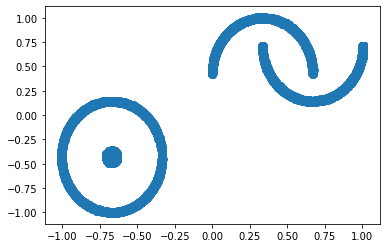

In [9]:
true_data = recover_original(added_noise_at_t, 20, noise)
plt.scatter(true_data[0], true_data[1])

# building a model

In [10]:
learning_rate = 1e-3
batch_size = 2048

from torch import nn

    
class DenoisingModelSequential(nn.Module):
    
    def __init__(self, hidden_units=32):
        super(DenoisingModelSequential, self).__init__()
        # hidden_units = 32
        
        self.mlp = nn.Sequential(
            nn.Linear(5, int(hidden_units), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units), int(hidden_units/2), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/2), int(hidden_units/4), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/4), int(hidden_units/8), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/8), int(hidden_units/16), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/16), int(hidden_units/8), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/8), int(hidden_units/4), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/4), int(hidden_units/2), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/2), int(hidden_units), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units), 2, bias=True)
        )
        
        
    def forward(self, x):
        x = self.mlp(x)
        return x
      
denoising_model = DenoisingModelSequential(128)
print(denoising_model)

loss_func = nn.HuberLoss()
optimizer = torch.optim.Adam(denoising_model.parameters(), lr=learning_rate)

DenoisingModelSequential(
  (mlp): Sequential(
    (0): Linear(in_features=5, out_features=128, bias=True)
    (1): GELU(approximate='none')
    (2): Linear(in_features=128, out_features=64, bias=True)
    (3): GELU(approximate='none')
    (4): Linear(in_features=64, out_features=32, bias=True)
    (5): GELU(approximate='none')
    (6): Linear(in_features=32, out_features=16, bias=True)
    (7): GELU(approximate='none')
    (8): Linear(in_features=16, out_features=8, bias=True)
    (9): GELU(approximate='none')
    (10): Linear(in_features=8, out_features=16, bias=True)
    (11): GELU(approximate='none')
    (12): Linear(in_features=16, out_features=32, bias=True)
    (13): GELU(approximate='none')
    (14): Linear(in_features=32, out_features=64, bias=True)
    (15): GELU(approximate='none')
    (16): Linear(in_features=64, out_features=128, bias=True)
    (17): GELU(approximate='none')
    (18): Linear(in_features=128, out_features=2, bias=True)
  )
)


loss: 0.342937  [   10/ 2048]


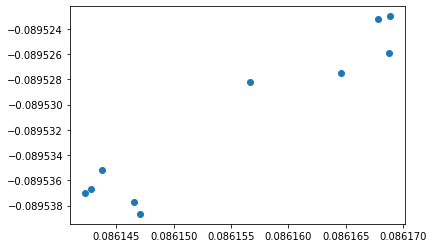

In [11]:
##### testing neural network above

test_noise_step = 5
data_noisy, noise = get_noisy(data_transformed[:2, 0:10], test_noise_step)

t_ = torch.Tensor([test_noise_step])
t_ = t_.repeat(10)
data_noisy = torch.vstack([data_noisy, data_transformed[2:4, 0:10], t_])

with torch.no_grad():
    for epoch in range(1, 2):
        data_pred = denoising_model(data_noisy.T)
        loss_ = loss_func(noise[:, 0:10].T, data_pred)
        loss, current = loss_.item(), 1 * 10
        print(f"loss: {loss:>7f}  [{current:>5d}/{batch_size:>5d}]")
    
# print(data_pred, data_transformed[:, 1:10].T)

plt.scatter(data_pred.T[0], data_pred.T[1])

In [12]:
# v = torch.sqrt(1/2 * (1/sigma_squared_q_t) * ((betas)**2 / ((1) * alphas)))

# plt.plot(v)

In [13]:
from copy import deepcopy
import pickle
import sys

def train_model(denoising_model, data_transformed, model_name, train_new_model=False, energy_method=False):
    best_loss = sys.float_info.max # initialization
        
    if train_new_model or not os.path.exists(osp.join(model_paths, model_name + '.pt')):
        losses = []
        for epoch in range(1, epochs+1):
            for n in range(1, int(len(data_transformed[0])/batch_size) + 1):
                data_in_batch = data_transformed[:, (n-1)*batch_size:(n*batch_size)]
                idx = torch.randint(0, timesteps-1, (batch_size, )).long()
                timestep = idx.add(1)
                data_noisy, noise = get_noisy(data_in_batch[:2, :], timestep)
                optimizer.zero_grad(set_to_none=True)
                data_noisy_stacked = torch.vstack([data_noisy, data_in_batch[2:4, :], timestep])
                pred_data = denoising_model(data_noisy_stacked.T)
                if not energy_method:
                    imp_weight = torch.sqrt(1/2 * (1/sigma_squared_q_t_corrected[timestep]) * ((betas[timestep])**2 / (variance[timestep] * alphas[timestep])))
                    # loss on prediction
                    loss_ = loss_func(noise.mul(imp_weight), pred_data.T.mul(imp_weight))
                else:
                    ## Energy function interpretation
                    imp_weight = torch.sqrt(1/2 * (1/sigma_squared_q_t_corrected[timestep]) * ((betas[timestep])**2 / (alphas[timestep])))
                    # loss on prediction
                    loss_ = loss_func(noise.div(-sd[timestep]).mul(imp_weight), pred_data.T.mul(imp_weight))


                loss_.backward()
                optimizer.step()
                
            ## evaluating noise on a fixed timestep to calculate best model
            with torch.no_grad():
                one_timestep = torch.Tensor([1]).repeat(batch_size).long()
                data_noisy_temp, noise_temp = get_noisy(data_in_batch[:2, :], one_timestep)
                data_noisy_stacked_temp = torch.vstack([data_noisy_temp, data_in_batch[2:4, :], one_timestep])
                pred_data_temp = denoising_model(data_noisy_stacked_temp.T)
                # loss on prediction
                if not energy_method:
                    loss_temp = loss_func(noise_temp.mul(1), pred_data_temp.T.mul(1))
                else:
                    loss_temp = loss_func(noise_temp.div(-sd[1]).mul(1), pred_data_temp.T.mul(1))
                losses.append(loss_temp.item())

            if loss_temp.item() < best_loss:
                best_loss = loss_temp.item()
                print(f"saving epoch: {epoch} loss: {best_loss:>7f}")
                if not dont_write:
                  torch.save(deepcopy(denoising_model.state_dict()), osp.join(model_paths, model_name + '.pt'))
                  write_cached([data_noisy, pred_data, data_in_batch, timestep, losses], osp.join(data_paths, model_name + '_state.pt'))

            if epoch % 20 == 0:
                loss = loss_temp.item()
                print(f"epoch: {epoch} loss: {loss:>7f}")

    if not dont_write and os.path.exists(osp.join(model_paths, model_name + '.pt')):
        denoising_model.load_state_dict(torch.load(osp.join(model_paths, model_name + '.pt')))
        data_noisy, pred_data, data_in_batch, timestep, losses = load_cached(osp.join(data_paths, model_name + '_state.pt')) 
        return data_noisy, pred_data, data_in_batch, timestep, losses
    return data_noisy, pred_data, data_in_batch, timestep, losses

saving epoch: 1 loss: 29.973034
epoch: 20 loss: 30.777241
saving epoch: 26 loss: 29.709770
saving epoch: 27 loss: 29.363703
saving epoch: 28 loss: 28.897251
saving epoch: 29 loss: 28.783340
saving epoch: 30 loss: 28.603081
saving epoch: 35 loss: 27.845524
saving epoch: 38 loss: 27.692953
saving epoch: 39 loss: 26.916315
epoch: 40 loss: 27.374447
saving epoch: 41 loss: 26.855333
saving epoch: 42 loss: 26.831758
saving epoch: 46 loss: 26.039766
saving epoch: 51 loss: 25.932861
saving epoch: 52 loss: 25.423151
saving epoch: 53 loss: 25.160845
saving epoch: 59 loss: 25.108112
saving epoch: 60 loss: 24.502182
epoch: 60 loss: 24.502182
saving epoch: 63 loss: 24.465408
saving epoch: 69 loss: 24.283321
saving epoch: 75 loss: 24.159296
saving epoch: 79 loss: 23.870600
epoch: 80 loss: 24.113844
saving epoch: 81 loss: 23.223747
saving epoch: 82 loss: 23.189951
saving epoch: 86 loss: 22.942503
epoch: 100 loss: 23.062525


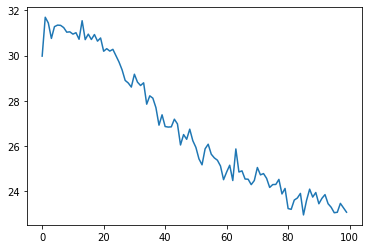

In [14]:
data_noisy, pred_data, data_in_batch, timestep, losses = train_model(denoising_model, data_transformed, 'complex_classifier_free_guidance.energy_method', train_new_model= (train_new_model | generate_new_data), energy_method=True)
plt.plot(torch.Tensor(losses))

In [15]:
mean_coeff_1 = torch.sqrt(alphas)*(1 - alphas_prev_) / variance
mean_coeff_2 = torch.sqrt(alphas_prev_) * betas / variance

def generate_data(denoising_model, tt=timesteps, energy_method=False, clipped_version=False, labels=None):
    # final_step_data = get_noisy(data_transformed, timesteps-1)
    # mean_last_step = torch.mean(final_step_data, dim=1)
    # std_last_step = torch.std(final_step_data, dim=1)
    batch_size_generation = 1024*1
    # (tensor([0.4086, 0.4253]), tensor([-0.6379,  0.0137])))
    data_noisy =  torch.normal(mean=0, std=1, size=(2, batch_size_generation))
    # data_noisy_x =  torch.normal(mean=mean_last_step[0], std=std_last_step[0], size=(1, batch_size_generation))

    # data_noisy = torch.vstack([data_noisy_x, data_noisy_y])
    if not labels:
      labelled_values = torch.zeros((2, batch_size_generation))
    elif labels=="circles":
      labelled_values = torch.vstack([torch.ones(batch_size_generation), torch.zeros(batch_size_generation)])
    elif labels=="moon":
      labelled_values = torch.vstack([torch.zeros(batch_size_generation), torch.ones(batch_size_generation)])
    elif labels=="mixed":
      batch_size_generation_ = int(batch_size_generation/2)
      labelled_values_1 = torch.vstack([torch.ones(batch_size_generation_), torch.zeros(batch_size_generation_)])
      labelled_values_2 = torch.vstack([torch.zeros(batch_size_generation_), torch.ones(batch_size_generation_)])
      labelled_values = torch.hstack([labelled_values_1, labelled_values_2])
      
    datas = []
    datas.append(torch.vstack([data_noisy.cpu().detach(), labelled_values]))
    for n in range(1, int(len(data_noisy[0])/batch_size_generation) + 1):
        data_in_batch = data_noisy[:, (n-1)*batch_size_generation:(n*batch_size_generation)]
        for t in range(1, tt):
            timestep = tt-t
            t_repeated = torch.Tensor([timestep]).repeat(batch_size_generation)
            data_stacked = torch.vstack([data_in_batch, labelled_values, t_repeated])
            pred_data = denoising_model(data_stacked.T)
            if not clipped_version:
                if not energy_method:
                    #### Note: this implementation has numerical issues, so calculating it another way below to avoid numerical issues
                    # mean_data_1 = data_in_batch.T.mul(1/torch.sqrt(alphas_[timestep]))
                    # mean_data_2 = pred_data.mul((1-alphas[timestep])/(sd[timestep]*torch.sqrt(alphas[timestep])))
                    # mean_data = mean_data_1.sub(mean_data_2)
                    ######

                    # optimization:: not sure if exp(log(x) - log(y)) instead of x/y helps numerically
                    multiplier = torch.exp(torch.log((betas[timestep])) - torch.log(sd[timestep]))
                    mean_data = (data_in_batch.T.sub(pred_data.mul(multiplier))).div(torch.sqrt(alphas[timestep]))
                else:
                    ##
                    # Energy function interpretation
                    mean_data = (data_in_batch.T.add(pred_data.mul((betas[timestep])))).div(torch.sqrt(alphas[timestep]))
                    ##
            else:
                # clipping an improvement as recommended in https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils.py#L171
                # this helps in improving the samples generated as it keeps the random variables in the range of -1 to +1
                if not energy_method:
                    x_reconstructed = data_in_batch.T.sub(pred_data.mul(sd[timestep])).div(torch.sqrt(alphas_[timestep]))
                    if timestep >= 5:
                        x_reconstructed = torch.clip(x_reconstructed, -1., 1.)
                else:
                    # energy method and clipping to improve stabalization
                    x_reconstructed = data_in_batch.T.add(pred_data.mul(variance[timestep])).div(torch.sqrt(alphas_[timestep]))
                    if timestep >= 5:
                        x_reconstructed = torch.clip(x_reconstructed, -1., 1.)
                
                mean_data_1 = data_in_batch.T.mul(mean_coeff_1[timestep])
                mean_data_2 = x_reconstructed.mul(mean_coeff_2[timestep])
                mean_data = mean_data_1.add(mean_data_2)
                    
                

            posterior_data = posterior_variance_corrected[timestep]
            data_in_batch = torch.normal(mean_data, torch.sqrt(posterior_data)).T
            datas.append(torch.vstack([data_in_batch.cpu().detach(), labelled_values]))
    return datas, data_in_batch

(-15.0, 30.0)

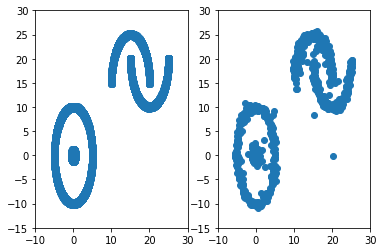

In [16]:
tt = 200
datas, data_in_batch = generate_data(denoising_model, tt, energy_method=True, clipped_version=True, labels=None)

data_in_batch = data_in_batch.cpu().detach()
data_pred = reverse_transform(data_in_batch.cpu().detach(), min_, max_)
_, (ax1, ax2) = plt.subplots(1, 2)

ax1.scatter(complex_data[0], complex_data[1])
ax2.scatter(data_pred[0], data_pred[1])
ax1.set_xlim([-10, 30])
ax1.set_ylim([-15, 30])

ax2.set_xlim([-10, 30])
ax2.set_ylim([-15, 30])

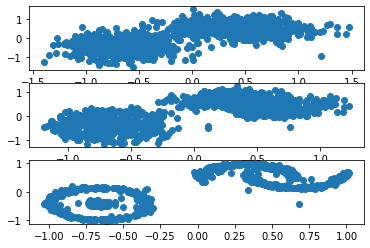

In [17]:
_, (ax5, ax6, ax7) = plt.subplots(3)

ax5.scatter(datas[tt - 25][0], datas[tt - 25][1])
ax6.scatter(datas[tt - 12][0], datas[tt - 12][1])
ax7.scatter(datas[tt - 1][0], datas[tt - 1][1])

In [18]:
!pip install imageio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


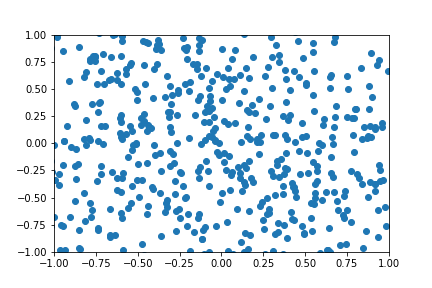

In [19]:
import imageio 
from IPython.display import Image

def print_gif(datas, name, color=False):
  filenames = []
  for i in range(0, len(datas)-20, 10):
    # plot the line chart
    if color:
      plt.scatter(datas[i][0], datas[i][1], c=datas[i][2]+ 2*datas[i][3])
    else:  
      plt.scatter(datas[i][0], datas[i][1])
    plt.ylim(-1,1)
    plt.xlim(-1, 1)

    # create file name and append it to a list
    filename = f'para-{i}.png'
    filenames.append(filename)

    # save frame
    plt.savefig(filename)
    plt.close()
    
  for j in range(len(datas)-20, len(datas)-1, 1):
    # plot the line chart
    if color: 
      plt.scatter(datas[j][0], datas[j][1], c=datas[j][2]+ 2*datas[j][3])
    else:
      plt.scatter(datas[j][0], datas[j][1])
    plt.ylim(-1,1)
    plt.xlim(-1, 1)

    # create file name and append it to a list
    filename = f'para-{i+j}.png'
    filenames.append(filename)

    # save frame
    plt.savefig(filename)
    plt.close()

  images = list(map(lambda filename: imageio.imread(filename), filenames))
      
  imageio.mimsave(os.path.join(name), images, fps=3) # modify the frame duration as needed

  # Remove files
  for filename in set(filenames):
      os.remove(filename)
  with open(name,'rb') as f:
    display(Image(data=f.read(), format='png'))
  
print_gif(datas, 'class_conditioned_no_labels.gif')

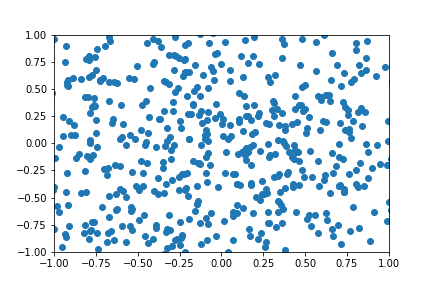

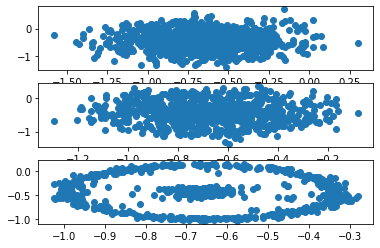

In [20]:
datas, data_in_batch = generate_data(denoising_model, tt, energy_method=True, clipped_version=True, labels="circles")
print_gif(datas, 'class_conditioned_circles.gif')

_, (ax5, ax6, ax7) = plt.subplots(3)

ax5.scatter(datas[tt - 25][0], datas[tt - 25][1])
ax6.scatter(datas[tt - 12][0], datas[tt - 12][1])
ax7.scatter(datas[tt - 1][0], datas[tt - 1][1])

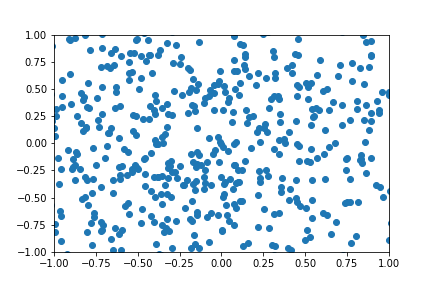

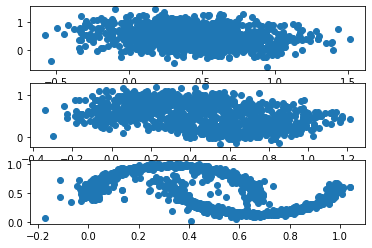

In [21]:
datas, data_in_batch = generate_data(denoising_model, tt, energy_method=True, clipped_version=True, labels="moon")
print_gif(datas, 'class_conditioned_moon.gif')

_, (ax5, ax6, ax7) = plt.subplots(3)

ax5.scatter(datas[tt - 25][0], datas[tt - 25][1])
ax6.scatter(datas[tt - 12][0], datas[tt - 12][1])
ax7.scatter(datas[tt - 1][0], datas[tt - 1][1])

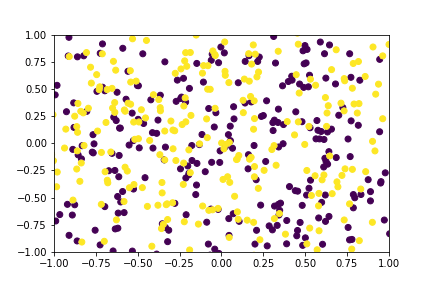

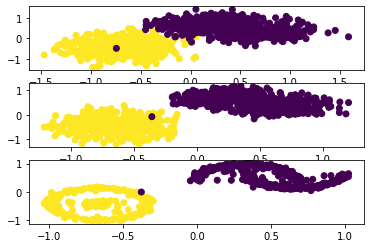

In [22]:
datas, data_in_batch = generate_data(denoising_model, tt, energy_method=True, clipped_version=True, labels="mixed")
print_gif(datas, 'class_conditioned_moon_circles.gif', color=True)

_, (ax5, ax6, ax7) = plt.subplots(3)

ax5.scatter(datas[tt - 25][0], datas[tt - 25][1], c=datas[tt - 25][2])
ax6.scatter(datas[tt - 12][0], datas[tt - 12][1], c=datas[tt - 12][2])
ax7.scatter(datas[tt - 1][0], datas[tt - 1][1], c=datas[tt - 1][2])

# experiments with few shot learning approach
* We will train unsupervised model 
* then finetune using small batch of samples

DenoisingModelSequential(
  (mlp): Sequential(
    (0): Linear(in_features=5, out_features=128, bias=True)
    (1): GELU(approximate='none')
    (2): Linear(in_features=128, out_features=64, bias=True)
    (3): GELU(approximate='none')
    (4): Linear(in_features=64, out_features=32, bias=True)
    (5): GELU(approximate='none')
    (6): Linear(in_features=32, out_features=16, bias=True)
    (7): GELU(approximate='none')
    (8): Linear(in_features=16, out_features=8, bias=True)
    (9): GELU(approximate='none')
    (10): Linear(in_features=8, out_features=16, bias=True)
    (11): GELU(approximate='none')
    (12): Linear(in_features=16, out_features=32, bias=True)
    (13): GELU(approximate='none')
    (14): Linear(in_features=32, out_features=64, bias=True)
    (15): GELU(approximate='none')
    (16): Linear(in_features=64, out_features=128, bias=True)
    (17): GELU(approximate='none')
    (18): Linear(in_features=128, out_features=2, bias=True)
  )
)
saving epoch: 1 loss: 31.310789


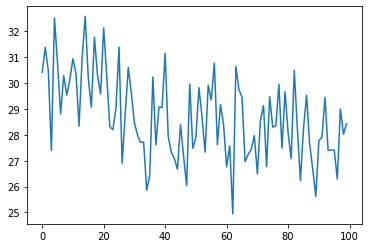

In [23]:
make_complex_model = DenoisingModelSequential(128)
print(make_complex_model)

loss_func = nn.HuberLoss()
optimizer = torch.optim.Adam(make_complex_model.parameters(), lr=learning_rate)

complex_data_normalized = numpy.array(data_transformed).T
complex_data_normalized_unlabelled = complex_data_normalized[(complex_data_normalized[:, 2] + complex_data_normalized[:, 3]) == 0]
complex_data_normalized_labelled = complex_data_normalized[(complex_data_normalized[:, 2] + complex_data_normalized[:, 3]) != 0][0:2048, :]

# complex_data_normalized = torch.Tensor(numpy.vstack([complex_data_normalized_unlabelled, complex_data_normalized_labelled]).T)
_, _, _, _, _ = train_model(make_complex_model, torch.Tensor(complex_data_normalized_unlabelled.T), 'complex_classifier_free_guidance.energy_method.few_shot_unlabelled', train_new_model=(train_new_model | generate_new_data), energy_method=True)

batch_size = 128
data_noisy, pred_data, data_in_batch, _, losses = train_model(make_complex_model, torch.Tensor(complex_data_normalized_labelled.T), 'complex_classifier_free_guidance.energy_method.few_shot_labelled', train_new_model=(train_new_model | generate_new_data), energy_method=True)
plt.plot(torch.Tensor(losses))

batch_size = 2048

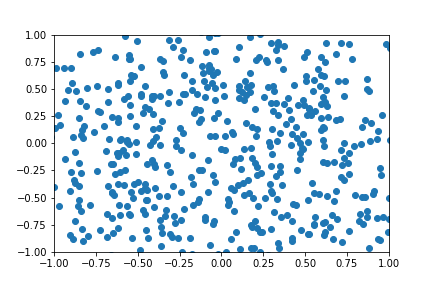

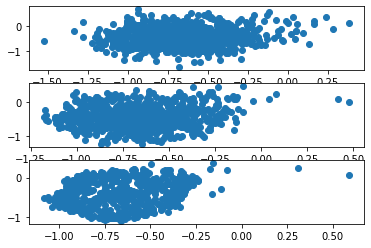

In [24]:
datas, data_in_batch = generate_data(make_complex_model, tt, energy_method=True, clipped_version=True, labels="circles")
print_gif(datas, 'class_conditioned_circles_few_shot.gif')

_, (ax5, ax6, ax7) = plt.subplots(3)

ax5.scatter(datas[tt - 25][0], datas[tt - 25][1])
ax6.scatter(datas[tt - 12][0], datas[tt - 12][1])
ax7.scatter(datas[tt - 1][0], datas[tt - 1][1])

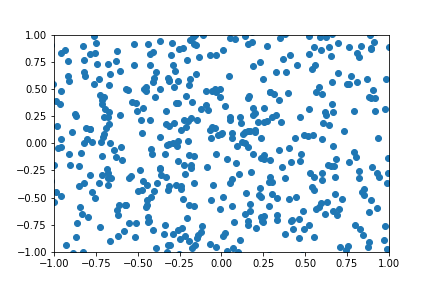

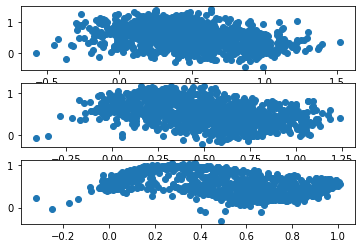

In [25]:
datas, data_in_batch = generate_data(make_complex_model, tt, energy_method=True, clipped_version=True, labels="moon")
print_gif(datas, 'class_conditioned_moon_few_shot.gif')

_, (ax5, ax6, ax7) = plt.subplots(3)

ax5.scatter(datas[tt - 25][0], datas[tt - 25][1])
ax6.scatter(datas[tt - 12][0], datas[tt - 12][1])
ax7.scatter(datas[tt - 1][0], datas[tt - 1][1])

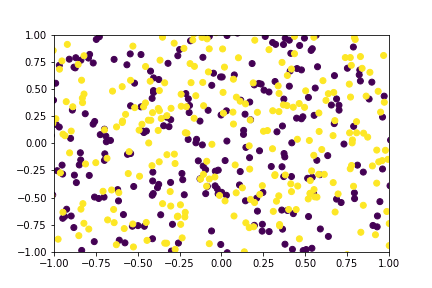

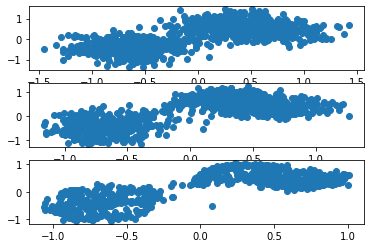

In [26]:
datas, data_in_batch = generate_data(make_complex_model, tt, energy_method=True, clipped_version=True, labels="mixed")
print_gif(datas, 'class_conditioned_mixed_few_shot.gif', color=True)

_, (ax5, ax6, ax7) = plt.subplots(3)

ax5.scatter(datas[tt - 25][0], datas[tt - 25][1])
ax6.scatter(datas[tt - 12][0], datas[tt - 12][1])
ax7.scatter(datas[tt - 1][0], datas[tt - 1][1])

# Timestep embedding using sinusoids 

In [27]:
import math
# adapted from HuggingFace -- https://huggingface.co/blog/annotated-diffusion

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings
      
# generating Sinusoids like this in my experience is damn slow and not required, since the embeddings are static and need not be generating everytime and number of timesteps is known before hand

# one time embeddings generation
sinusoidalPositionEmbeddings = SinusoidalPositionEmbeddings(8)
position_embeddings = sinusoidalPositionEmbeddings(torch.arange(0, timesteps))

#### Redfining the model and the train and generate steps

In [28]:
class DenoisingModelSequentialTimesteps(nn.Module):
    
    def __init__(self, hidden_units=32):
        super(DenoisingModelSequentialTimesteps, self).__init__()
        # hidden_units = 32
        self.position_mlp = nn.Sequential(
          # SinusoidalPositionEmbeddings(8),
          nn.GELU(), 
          nn.Linear(8, 4)
        )
        
        self.mlp = nn.Sequential(
            nn.Linear(4, int(hidden_units), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units), int(hidden_units/2), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/2), int(hidden_units/4), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/4), int(hidden_units/8), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/8), int(hidden_units/16), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/16), int(hidden_units/8), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/8), int(hidden_units/4), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/4), int(hidden_units/2), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units/2), int(hidden_units), bias=True),
            nn.GELU(),
            nn.Linear(int(hidden_units), 2, bias=True)
        )
        
        
    def forward(self, x, timestep=None):
      if timestep is not None:
        # using the generated embeddings for each position, instead of generating it each time
        timestep_embeddings = position_embeddings[timestep.long()]
        time_embeddings = self.position_mlp(timestep_embeddings)
        # time_embeddings = self.position_mlp(timestep)
        # concatenating time embeddings to input
        x = x.add(time_embeddings)
      x = self.mlp(x)
      return x
      
denoising_model = DenoisingModelSequentialTimesteps(128)
print(denoising_model)

loss_func = nn.HuberLoss()
optimizer = torch.optim.Adam(denoising_model.parameters(), lr=learning_rate)

DenoisingModelSequentialTimesteps(
  (position_mlp): Sequential(
    (0): GELU(approximate='none')
    (1): Linear(in_features=8, out_features=4, bias=True)
  )
  (mlp): Sequential(
    (0): Linear(in_features=4, out_features=128, bias=True)
    (1): GELU(approximate='none')
    (2): Linear(in_features=128, out_features=64, bias=True)
    (3): GELU(approximate='none')
    (4): Linear(in_features=64, out_features=32, bias=True)
    (5): GELU(approximate='none')
    (6): Linear(in_features=32, out_features=16, bias=True)
    (7): GELU(approximate='none')
    (8): Linear(in_features=16, out_features=8, bias=True)
    (9): GELU(approximate='none')
    (10): Linear(in_features=8, out_features=16, bias=True)
    (11): GELU(approximate='none')
    (12): Linear(in_features=16, out_features=32, bias=True)
    (13): GELU(approximate='none')
    (14): Linear(in_features=32, out_features=64, bias=True)
    (15): GELU(approximate='none')
    (16): Linear(in_features=64, out_features=128, bias=True)

In [29]:
# %%timeit -n 1000
##### testing neural network above
test_noise_step = 5
data_noisy, noise = get_noisy(data_transformed[:2, 0:10], test_noise_step)

t_ = torch.Tensor([test_noise_step])
t_ = t_.repeat(10)
data_noisy = torch.vstack([data_noisy, data_transformed[2:4, 0:10]])

with torch.no_grad():
    for epoch in range(1, 2):
        data_pred = denoising_model(data_noisy.T, t_)
        loss_ = loss_func(noise[:, 0:10].T, data_pred)
        loss, current = loss_.item(), 1 * 10
        # print(f"loss: {loss:>7f}  [{current:>5d}/{batch_size:>5d}]")
    
# print(data_pred, data_transformed[:, 1:10].T)

# plt.scatter(data_pred.T[0], data_pred.T[1])

In [30]:
from copy import deepcopy
import pickle
import sys

def train_model(denoising_model, data_transformed, model_name, train_new_model=False, energy_method=False):
    best_loss = sys.float_info.max # initialization
        
    if train_new_model or not os.path.exists(osp.join(model_paths, model_name + '.pt')):
        losses = []
        for epoch in range(1, epochs+1):
            for n in range(1, int(len(data_transformed[0])/batch_size) + 1):
                data_in_batch = data_transformed[:, (n-1)*batch_size:(n*batch_size)]
                idx = torch.randint(0, timesteps-1, (batch_size, )).long()
                timestep = idx.add(1)
                data_noisy, noise = get_noisy(data_in_batch[:2, :], timestep)
                optimizer.zero_grad(set_to_none=True)
                data_noisy_stacked = torch.vstack([data_noisy, data_in_batch[2:4, :]])
                pred_data = denoising_model(data_noisy_stacked.T, timestep)
                if not energy_method:
                    imp_weight = torch.sqrt(1/2 * (1/sigma_squared_q_t_corrected[timestep]) * ((betas[timestep])**2 / (variance[timestep] * alphas[timestep])))
                    # loss on prediction
                    loss_ = loss_func(noise.mul(imp_weight), pred_data.T.mul(imp_weight))
                else:
                    ## Energy function interpretation
                    imp_weight = torch.sqrt(1/2 * (1/sigma_squared_q_t_corrected[timestep]) * ((betas[timestep])**2 / (alphas[timestep])))
                    # loss on prediction
                    loss_ = loss_func(noise.div(-sd[timestep]).mul(imp_weight), pred_data.T.mul(imp_weight))


                loss_.backward()
                optimizer.step()
                
            ## evaluating noise on a fixed timestep to calculate best model
            with torch.no_grad():
                one_timestep = torch.Tensor([1]).repeat(batch_size).long()
                data_noisy_temp, noise_temp = get_noisy(data_in_batch[:2, :], one_timestep)
                data_noisy_stacked_temp = torch.vstack([data_noisy_temp, data_in_batch[2:4, :]])
                pred_data_temp = denoising_model(data_noisy_stacked_temp.T, one_timestep)
                # loss on prediction
                if not energy_method:
                    loss_temp = loss_func(noise_temp.mul(1), pred_data_temp.T.mul(1))
                else:
                    loss_temp = loss_func(noise_temp.div(-sd[1]).mul(1), pred_data_temp.T.mul(1))
                losses.append(loss_temp.item())

            if loss_temp.item() < best_loss:
                best_loss = loss_temp.item()
                print(f"saving epoch: {epoch} loss: {best_loss:>7f}")
                if not dont_write:
                  torch.save(deepcopy(denoising_model.state_dict()), osp.join(model_paths, model_name + '.pt'))
                  write_cached([data_noisy, pred_data, data_in_batch, timestep, losses], osp.join(data_paths, model_name + '_state.pt'))

            if epoch % 20 == 0:
                loss = loss_temp.item()
                print(f"epoch: {epoch} loss: {loss:>7f}")

    if not dont_write and os.path.exists(osp.join(model_paths, model_name + '.pt')):
        denoising_model.load_state_dict(torch.load(osp.join(model_paths, model_name + '.pt')))
        data_noisy, pred_data, data_in_batch, timestep, losses = load_cached(osp.join(data_paths, model_name + '_state.pt')) 
        return data_noisy, pred_data, data_in_batch, timestep, losses
    return data_noisy, pred_data, data_in_batch, timestep, losses

saving epoch: 1 loss: 31.622339
saving epoch: 2 loss: 30.948919
saving epoch: 4 loss: 30.935085
saving epoch: 7 loss: 30.806082
saving epoch: 9 loss: 30.498495
saving epoch: 17 loss: 30.359097
epoch: 20 loss: 30.450695
saving epoch: 23 loss: 29.652853
saving epoch: 27 loss: 29.314030
saving epoch: 32 loss: 28.998297
saving epoch: 34 loss: 28.880125
epoch: 40 loss: 29.000505
saving epoch: 43 loss: 28.722599
saving epoch: 48 loss: 28.161591
saving epoch: 52 loss: 28.151903
saving epoch: 56 loss: 28.111637
saving epoch: 57 loss: 28.010098
epoch: 60 loss: 28.674953
saving epoch: 64 loss: 27.994488
saving epoch: 66 loss: 27.913465
saving epoch: 67 loss: 27.227676
saving epoch: 69 loss: 26.960381
saving epoch: 74 loss: 26.866789
saving epoch: 79 loss: 26.412758
epoch: 80 loss: 26.747290
saving epoch: 84 loss: 26.406710
saving epoch: 88 loss: 26.275272
saving epoch: 92 loss: 26.242590
saving epoch: 98 loss: 25.793873
saving epoch: 99 loss: 25.459782
epoch: 100 loss: 26.363926
saving epoch: 10

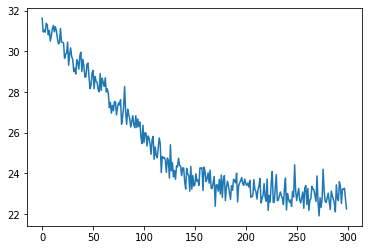

In [31]:
data_noisy, pred_data, data_in_batch, timestep, losses = train_model(denoising_model, data_transformed, 'complex_classifier_free_guidance.energy_method.position_embeddings', train_new_model= (train_new_model | generate_new_data), energy_method=True)
plt.plot(torch.Tensor(losses))

In [32]:
mean_coeff_1 = torch.sqrt(alphas)*(1 - alphas_prev_) / variance
mean_coeff_2 = torch.sqrt(alphas_prev_) * betas / variance

def generate_data(denoising_model, tt=timesteps, energy_method=False, clipped_version=False, labels=None):
    # final_step_data = get_noisy(data_transformed, timesteps-1)
    # mean_last_step = torch.mean(final_step_data, dim=1)
    # std_last_step = torch.std(final_step_data, dim=1)
    batch_size_generation = 1024*1
    # (tensor([0.4086, 0.4253]), tensor([-0.6379,  0.0137])))
    data_noisy =  torch.normal(mean=0, std=1, size=(2, batch_size_generation))
    # data_noisy_x =  torch.normal(mean=mean_last_step[0], std=std_last_step[0], size=(1, batch_size_generation))

    # data_noisy = torch.vstack([data_noisy_x, data_noisy_y])
    if not labels:
      labelled_values = torch.zeros((2, batch_size_generation))
    elif labels=="circles":
      labelled_values = torch.vstack([torch.ones(batch_size_generation), torch.zeros(batch_size_generation)])
    elif labels=="moon":
      labelled_values = torch.vstack([torch.zeros(batch_size_generation), torch.ones(batch_size_generation)])
    elif labels=="mixed":
      batch_size_generation_ = int(batch_size_generation/2)
      labelled_values_1 = torch.vstack([torch.ones(batch_size_generation_), torch.zeros(batch_size_generation_)])
      labelled_values_2 = torch.vstack([torch.zeros(batch_size_generation_), torch.ones(batch_size_generation_)])
      labelled_values = torch.hstack([labelled_values_1, labelled_values_2])
      
    datas = []
    datas.append(torch.vstack([data_noisy.cpu().detach(), labelled_values]))
    for n in range(1, int(len(data_noisy[0])/batch_size_generation) + 1):
        data_in_batch = data_noisy[:, (n-1)*batch_size_generation:(n*batch_size_generation)]
        for t in range(1, tt):
            timestep = tt-t
            t_repeated = torch.Tensor([timestep]).repeat(batch_size_generation)
            data_stacked = torch.vstack([data_in_batch, labelled_values])
            pred_data = denoising_model(data_stacked.T, t_repeated)
            if not clipped_version:
                if not energy_method:
                    # optimization:: not sure if exp(log(x) - log(y)) instead of x/y helps numerically
                    multiplier = torch.exp(torch.log((betas[timestep])) - torch.log(sd[timestep]))
                    mean_data = (data_in_batch.T.sub(pred_data.mul(multiplier))).div(torch.sqrt(alphas[timestep]))
                else:
                    ##
                    # Energy function interpretation
                    mean_data = (data_in_batch.T.add(pred_data.mul((betas[timestep])))).div(torch.sqrt(alphas[timestep]))
                    ##
            else:
                # clipping an improvement as recommended in https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils.py#L171
                # this helps in improving the samples generated as it keeps the random variables in the range of -1 to +1
                if not energy_method:
                    x_reconstructed = data_in_batch.T.sub(pred_data.mul(sd[timestep])).div(torch.sqrt(alphas_[timestep]))
                    if timestep >= 5:
                        x_reconstructed = torch.clip(x_reconstructed, -1., 1.)
                else:
                    # energy method and clipping to improve stabalization
                    x_reconstructed = data_in_batch.T.add(pred_data.mul(variance[timestep])).div(torch.sqrt(alphas_[timestep]))
                    if timestep >= 5:
                        x_reconstructed = torch.clip(x_reconstructed, -1., 1.)
                
                mean_data_1 = data_in_batch.T.mul(mean_coeff_1[timestep])
                mean_data_2 = x_reconstructed.mul(mean_coeff_2[timestep])
                mean_data = mean_data_1.add(mean_data_2)
                    
                

            posterior_data = posterior_variance_corrected[timestep]
            data_in_batch = torch.normal(mean_data, torch.sqrt(posterior_data)).T
            datas.append(torch.vstack([data_in_batch.cpu().detach(), labelled_values]))
    return datas, data_in_batch

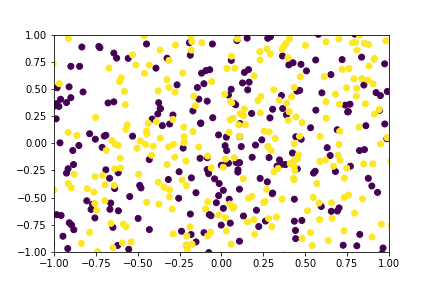

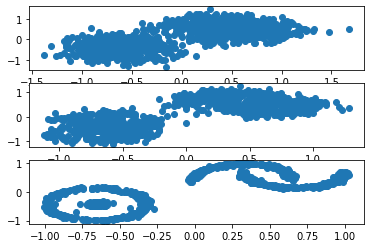

In [33]:
datas, data_in_batch = generate_data(denoising_model, tt, energy_method=True, clipped_version=True, labels="mixed")
print_gif(datas, 'class_conditioned_mixed_few_shot_position_embeddings.gif', color=True)

_, (ax5, ax6, ax7) = plt.subplots(3)
tt= len(datas)
ax5.scatter(datas[tt - 25][0], datas[tt - 25][1])
ax6.scatter(datas[tt - 12][0], datas[tt - 12][1])
ax7.scatter(datas[tt - 1][0], datas[tt - 1][1])

# Faster Sampling by taking multiple strides at the same time during generation of new samples

Note: we will do this by keeping variance fixed. We will re-estimate variance using 

`N(x_t-5|x_t, x_0)` -- compared to `N(x_t-1|x_t, x_0)`

ie. we take 5 steps simultaneously in the reverse denoising process compared to 1 earlier, generation should speed up 5 times

* we shall keep posterior variance sigma_x_t-5 fixed as earlier 
* estimate mu_x_t-5 using the score prediction method as earlier

In [34]:
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L196
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L78
posterior_variance = (betas) * (1 - alphas_prev_) / (1 - alphas_)
log_posterior_variance = torch.log(torch.hstack([posterior_variance[1], posterior_variance[1:]]))
posterior_variance_corrected = torch.exp(log_posterior_variance)

strided_schedule = list(range(1, timesteps, 4)) + [199]

alphas_strided_ = alphas_[strided_schedule]
alphas_prev_strided_ = F.pad(alphas_strided_[:-1], [1, 0], "constant", 1.0)

betas_strided = 1 - (alphas_strided_/alphas_prev_strided_)
posterior_variance_new_schedule = betas_strided * (1 - alphas_prev_strided_)/ (1-alphas_strided_)
log_posterior_variance = torch.log(torch.hstack([posterior_variance_new_schedule[1], posterior_variance_new_schedule[1:]]))
posterior_variance_new_schedule_corrected = torch.exp(log_posterior_variance)

In [35]:
mean_coeff_1 = torch.sqrt(1-betas_strided)*(1 - alphas_prev_strided_) / (1 - alphas_strided_)
mean_coeff_2 = torch.sqrt(alphas_prev_strided_) * betas_strided / (1 - alphas_strided_)

def generate_data(denoising_model, tt=timesteps, energy_method=False, clipped_version=False, labels=None):
    # final_step_data = get_noisy(data_transformed, timesteps-1)
    # mean_last_step = torch.mean(final_step_data, dim=1)
    # std_last_step = torch.std(final_step_data, dim=1)
    batch_size_generation = 1024*1
    # (tensor([0.4086, 0.4253]), tensor([-0.6379,  0.0137])))
    data_noisy =  torch.normal(mean=0, std=1, size=(2, batch_size_generation))
    # data_noisy_x =  torch.normal(mean=mean_last_step[0], std=std_last_step[0], size=(1, batch_size_generation))

    # data_noisy = torch.vstack([data_noisy_x, data_noisy_y])
    if not labels:
      labelled_values = torch.zeros((2, batch_size_generation))
    elif labels=="circles":
      labelled_values = torch.vstack([torch.ones(batch_size_generation), torch.zeros(batch_size_generation)])
    elif labels=="moon":
      labelled_values = torch.vstack([torch.zeros(batch_size_generation), torch.ones(batch_size_generation)])
    elif labels=="mixed":
      batch_size_generation_ = int(batch_size_generation/2)
      labelled_values_1 = torch.vstack([torch.ones(batch_size_generation_), torch.zeros(batch_size_generation_)])
      labelled_values_2 = torch.vstack([torch.zeros(batch_size_generation_), torch.ones(batch_size_generation_)])
      labelled_values = torch.hstack([labelled_values_1, labelled_values_2])
      
    datas = []
    datas.append(torch.vstack([data_noisy.cpu().detach(), labelled_values]))
    for n in range(1, int(len(data_noisy[0])/batch_size_generation) + 1):
        data_in_batch = data_noisy[:, (n-1)*batch_size_generation:(n*batch_size_generation)]
        for t in range(1, len(strided_schedule)+1):
            timestep = strided_schedule[len(strided_schedule)-t]
            t_repeated = torch.Tensor([timestep]).repeat(batch_size_generation)
            data_stacked = torch.vstack([data_in_batch, labelled_values])
            pred_data = denoising_model(data_stacked.T, t_repeated)
            if not clipped_version:
                if not energy_method:
                    # optimization:: not sure if exp(log(x) - log(y)) instead of x/y helps numerically
                    multiplier = torch.exp(torch.log((betas[timestep])) - torch.log(sd[timestep]))
                    mean_data = (data_in_batch.T.sub(pred_data.mul(multiplier))).div(torch.sqrt(alphas[timestep]))
                else:
                    ##
                    # Energy function interpretation
                    mean_data = (data_in_batch.T.add(pred_data.mul((betas[timestep])))).div(torch.sqrt(alphas[timestep]))
                    ##
            else:
                # clipping an improvement as recommended in https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils.py#L171
                # this helps in improving the samples generated as it keeps the random variables in the range of -1 to +1
                if not energy_method:
                    x_reconstructed = data_in_batch.T.sub(pred_data.mul(sd[timestep])).div(torch.sqrt(alphas_[timestep]))
                    if timestep >= 5:
                        x_reconstructed = torch.clip(x_reconstructed, -1., 1.)
                else:
                    # energy method and clipping to improve stabalization
                    x_reconstructed = data_in_batch.T.add(pred_data.mul(variance[timestep])).div(torch.sqrt(alphas_[timestep]))
                    if timestep >= 5:
                        x_reconstructed = torch.clip(x_reconstructed, -1., 1.)
                
                mean_data_1 = data_in_batch.T.mul(mean_coeff_1[len(strided_schedule)-t])
                mean_data_2 = x_reconstructed.mul(mean_coeff_2[len(strided_schedule)-t])
                mean_data = mean_data_1.add(mean_data_2)
                    
                

            posterior_data = posterior_variance_new_schedule_corrected[len(strided_schedule)-t]
            data_in_batch = torch.normal(mean_data, torch.sqrt(posterior_data)).T
            datas.append(torch.vstack([data_in_batch.cpu().detach(), labelled_values]))
    return datas, data_in_batch

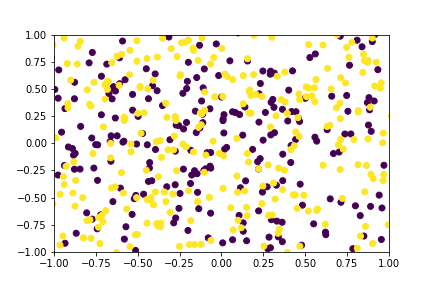

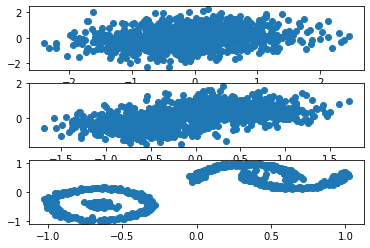

In [36]:
datas, data_in_batch = generate_data(denoising_model, tt, energy_method=True, clipped_version=True, labels="mixed")
print_gif(datas, 'class_conditioned_mixed_few_shot_position_embeddings_fast.gif', color=True)

_, (ax5, ax6, ax7) = plt.subplots(3)
tt= len(datas)

ax5.scatter(datas[tt - 25][0], datas[tt - 25][1])
ax6.scatter(datas[tt - 12][0], datas[tt - 12][1])
ax7.scatter(datas[tt - 1][0], datas[tt - 1][1])